In [1]:
"""
Alexandre
2024/10/21
"""

# Trying to simulate some activity in a range of parameters space and trying to decod it with a multinomilae logistic regression

'\nAlexandre\n2024/10/21\n'

# **Encoding and Decoding**

## Initialisation part

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import nest
import os


              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: 3.8.0
 Built: Aug  5 2024 06:09:47

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.



In [3]:
cwd = os.getcwd()
print(cwd)

results_fodler_name = "F_results"
os.makedirs(
    os.path.join(cwd, results_fodler_name),
    exist_ok=True
)

/root/EBRAIN-Fall-School/nest_project_eitn_24/Encoding_Layer_Alexandre


## network generation

In [4]:
# set general parameters
seed = 1
dt = 0.1
num_threads = 8

# initialize nest kernel
nest.ResetKernel()
nest.SetKernelStatus({
    'rng_seed': seed,
    'resolution': dt,
    'local_num_threads': num_threads
})

# general parameters
gamma = 0.25 # relative number of inhibitory

# encoding layer parameters
nEnc = 500  # number of neurons in the encoding layer
J_bias = 200. # [pA]

# main network parameters
NE = 1000 # number of excitatory neurons (10.000 in [1])
CE = 200 # indegree from excitatory neurons

# synapse parameters
w = 0.1 # excitatory synaptic weight (mV)
g = 5. # relative inhibitory to excitatory synaptic weight
d = 1.5 # synaptic transmission delay (ms)


Oct 24 10:24:22 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.


In [5]:
# create the encoding layer
enc_layer = nest.Create(
    model='iaf_psc_delta', 
    n=nEnc, 
    params={'I_e': J_bias}
)

# record the activity of the encoding layer
enc_spks = nest.Create('spike_recorder')
nest.Connect(enc_layer, enc_spks)

##### MAIN NETWORK #####
# population parameters
NI = int(gamma * NE) # number of inhibitory neurons
CI = int(gamma * CE) # indegree from inhibitory neurons

# neuron paramters
neuron_params = {
    'C_m': 1.0,            # membrane capacity (pF)
    'E_L': 0.,             # resting membrane potential (mV)
    'I_e': 0.,             # external input current (pA)
    'V_m': 0.,             # membrane potential (mV)
    'V_reset': 10.,        # reset membrane potential after a spike (mV)
    'V_th': 20.,           # spike threshold (mV)
    't_ref': 2.0,          # refractory period (ms)
    'tau_m': 20.,          # membrane time constant (ms)
}

# set default parameters for neurons and create neurons
nest.SetDefaults('iaf_psc_delta', neuron_params)
neurons_e = nest.Create('iaf_psc_delta', NE)
neurons_i = nest.Create('iaf_psc_delta', NI)

# create spike detectors
main_spks = nest.Create('spike_recorder')

# E synapses
syn_exc = {'delay': d, 'weight': w}
conn_exc = {'rule': 'fixed_indegree', 'indegree': CE}
nest.Connect(neurons_e, neurons_e, conn_exc, syn_exc)
nest.Connect(neurons_e, neurons_i, conn_exc, syn_exc)

# I synapses
syn_inh = {'delay': d, 'weight': - g * w}
conn_inh = {'rule': 'fixed_indegree', 'indegree': CI}
nest.Connect(neurons_i, neurons_e, conn_inh, syn_inh)
nest.Connect(neurons_i, neurons_i, conn_inh, syn_inh)

# spike detector
nest.Connect(neurons_e, main_spks)

# connect the encoding layer to both neuronal population
nest.Connect(enc_layer, neurons_e, conn_exc, syn_exc)
nest.Connect(enc_layer, neurons_i, conn_exc, syn_exc)

### generate input

In [6]:
# stimulus parameters
sim_time = 2_000.
frequency = 5e-3
tau = 20
scale = 1.

In [7]:
def gen_stim(
    sim_time=sim_time,
    dt=dt,
    frequency=frequency,
    scale=scale,
    tau=tau
):
    time = np.arange(dt, sim_time, dt)
    pre_sig = (np.sin(2 * np.pi * time * frequency) + 1) / 2 * scale

    noise = np.zeros_like(time)
    for t in range(len(noise)-1):
        n = np.random.randn() * 5
        noise[t+1] = (1-dt/tau)*noise[t]+ (dt*n/tau)

    sig = pre_sig + noise

    return time, sig, pre_sig

### connection between input and encoding layer

In [8]:
frequency_1 = 0.005
frequency_2 = 0.01
scale = 2
tau_1 = 20
tau_2 = 5

In [9]:
time, sig_1, pre_sig_1 = gen_stim(
    sim_time=sim_time, dt=dt,
    frequency=frequency_1, scale=scale,
    tau=tau_1
)

time, sig_2, pre_sig_2 = gen_stim(
    sim_time=sim_time, dt=dt,
    frequency=frequency_2, scale=scale,
    tau=tau_2
)

sig = sig_1 * sig_2

print(sig.shape)

(19999,)


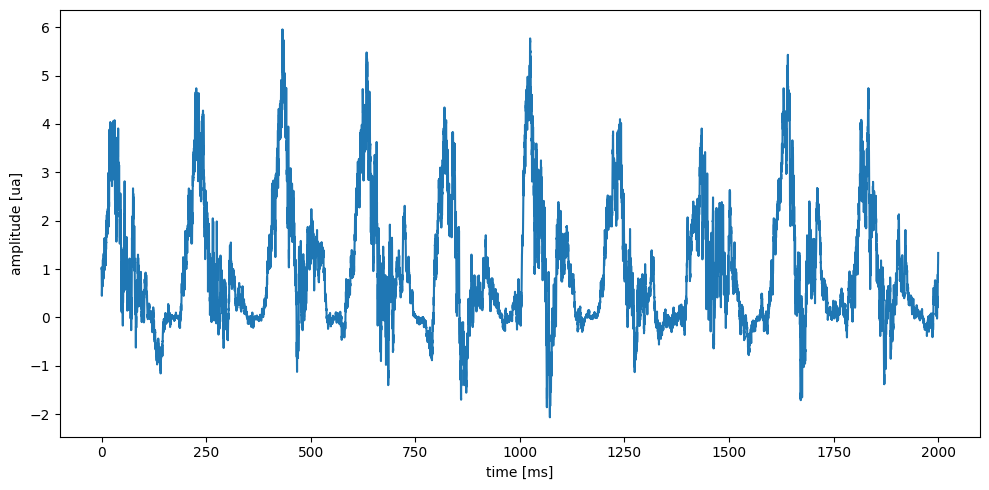

In [10]:
fig,ax = plt.subplots(
    nrows=1,
    ncols=1,
    figsize=(10,5)
)

ax.plot(
    time,
    sig
)

ax.set_xlabel("time [ms]")
ax.set_ylabel("amplitude [ua]")

plt.tight_layout()
plt.show()

In [11]:
# encoding layer 1 reparametrisation
tuning = 250. * np.random.randn(nEnc) + 1000. # 
thresholds = 5 * np.random.randn(nEnc) - 50. # generate some heterogeneity on the population
thresholds = np.maximum(thresholds, -65.) # 
Vm0 = np.array(np.random.uniform(low=-70., high=-50., size=int(nEnc))) # randomized initiate point of each neuron

In [12]:
step_generator = nest.Create(
    model='step_current_generator', 
    n=nEnc
)

amplitudes = np.zeros((nEnc, len(sig)))

for n in range(nEnc): # for each neuron in the encoding layer
    
    # transform the input as function of the tuning of each neuron
    amplitudes[n, :] = sig * tuning[n]
    
    # change parameters of each neuron in the input layer
    enc_layer[n].set(
        {
            'V_m': Vm0[n], # set the membrane potential initialisation
            'V_th': thresholds[n] # set the excitation threshold
        }
    )

    # change caracteristics of the input generator
    step_generator[n].set(
        {
            'amplitude_times': time, # set the time
            'amplitude_values': amplitudes[n] # set the amplitude
        }
    )

    # connect the input generator to the encoding layer neuron one-by-one
    nest.Connect(
        step_generator[n],
        enc_layer[n]
    )

### run the simulation

In [13]:
# run the simulation
nest.Simulate(sim_time)


Oct 24 10:24:24 NodeManager::prepare_nodes [Info]: 
    Preparing 5766 nodes for simulation.

Oct 24 10:24:24 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 5766
    Simulation time (ms): 2000
    Number of OpenMP threads: 8
    Number of MPI processes: 1

Oct 24 10:24:27 SimulationManager::run [Info]: 
    Simulation finished.


### extract results

In [14]:
# extract the simulation results
from utils.extractors import filter_spikes_parallel

filter_tau = 20. # [ms]

In [15]:
enc_activity = enc_spks.events
enc_states = filter_spikes_parallel(
    enc_activity['times'], enc_activity['senders'], # use the timing and the origin of each spike of the encoding layer
    nEnc, # total number of neuron in the encoding layer
    t_start=dt, t_stop=sim_time, dt=dt, # begin, end and time-step of the simulation
    tau=filter_tau, 
    n_processes=num_threads
)


main_activity = main_spks.events
main_states = filter_spikes_parallel(
    main_activity['times'], main_activity['senders'], 
    NE, 
    t_start=dt, t_stop=sim_time, dt=dt, 
    tau=filter_tau, 
    n_processes=num_threads
)

Filtering SpikeTrains: 100%|██████████| 1000/1000 [00:28<00:00, 35.48it/s]


### decoding

In [16]:
from sklearn.linear_model import LinearRegression

In [17]:
def compute_capacity(x, z):
    """
    Compute capacity to reconstruct z based on linearly combining x

    Parameters
    ----------
    x : np.ndarray
        state matrix(NxT)
    z : np.ndarray
        target output (1xT)

    Returns
    -------
    z_hat : np.ndarray
        Reconstructed (predicted) signal

    """
    reg = LinearRegression(
        n_jobs=-1, 
        fit_intercept=False
    ).fit(x.T, z)
    
    W_out = reg.coef_
    z_hat = np.dot(W_out, x)

    covs = np.cov(z_hat, z)[0, 1] ** 2.0
    vars = np.var(z) * np.var(z_hat)
    capacity = covs / vars

    error = np.mean((z - z_hat) ** 2)
    return z_hat, capacity, error

In [18]:
enc_estimate, enc_capacity, enc_error = compute_capacity(enc_states, sig)
main_estimate, main_capacity, main_error = compute_capacity(main_states, sig)

print(f"Encoding Layer 1: \n\t- Capacity={enc_capacity}, MSE={enc_error}")
print(f"Main Circuit: \n\t- Capacity={main_capacity}, MSE={main_error}")

Encoding Layer 1: 
	- Capacity=0.6819169274331018, MSE=0.5042590783598391
Main Circuit: 
	- Capacity=0.7543104303154947, MSE=0.4001514893514663


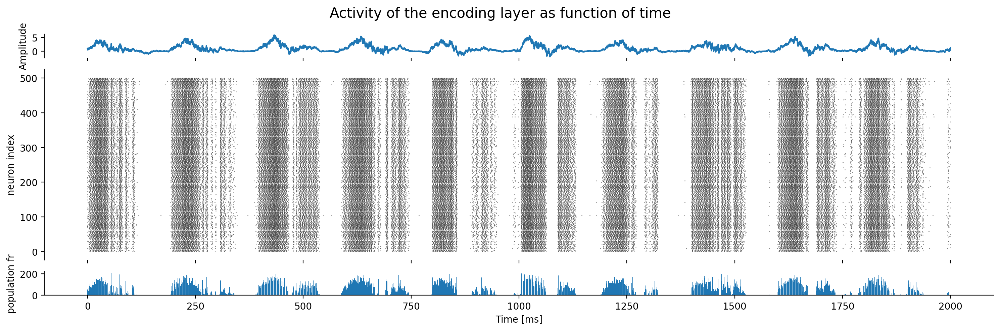

In [19]:
# graphical representation of the encoding layer spiking activity
fig,ax = plt.subplots(
    nrows=3,
    ncols=1,
    figsize=(15,5),
    dpi=200,
    gridspec_kw={"height_ratios":[0.1,0.8,0.1]},
    sharex=True
)

ax[0].plot(
    time,
    sig
)

ax[1].plot(
    enc_spks.events["times"],
    enc_spks.events["senders"],
    "|", color="black",
    markersize=1,
    alpha=0.5
)

values, bins = np.histogram(
    enc_spks.events["times"],
    bins=np.linspace(
        enc_spks.events["times"].min(), 
        enc_spks.events["times"].max(), 
        int(enc_spks.events["times"].max())
    )
)

ax[2].bar(
    x=bins[:-1],
    height=values/(bins[1]-bins[0]),
    width=(bins[1]-bins[0])/1.1
)

ax[0].set_ylabel(r'Amplitude')
ax[0].spines[["top","right","bottom"]].set_visible(False)

ax[1].set_ylabel(r"neuron index")
ax[1].spines[["top","bottom","right"]].set_visible(False)

ax[2].set_ylabel(r"population fr")
ax[2].spines[["top","right"]].set_visible(False)

ax[-1].set_xlabel(r'Time [ms]')

fig.suptitle("Activity of the encoding layer as function of time", size=15)

plt.tight_layout()
fig.savefig(os.path.join(results_fodler_name, "activity_encoding_layer.pdf"), dpi=200)
plt.show()

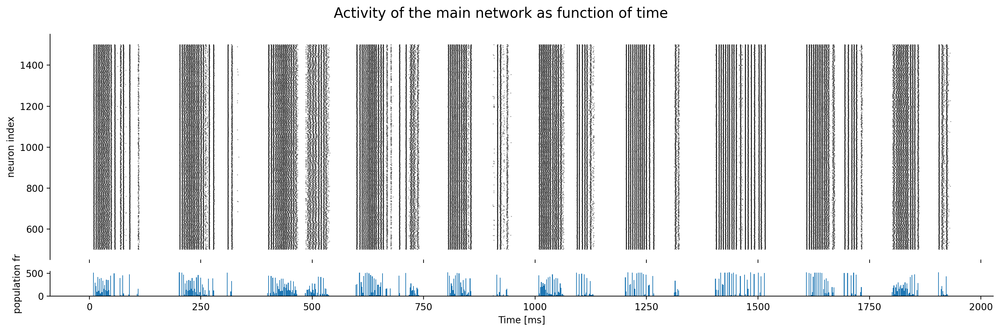

In [20]:
# graphical representation of the main network
fig,ax = plt.subplots(
    nrows=2,
    ncols=1,
    figsize=(15,5),
    dpi=200,
    gridspec_kw={"height_ratios":[0.9,0.1]},
    sharex=True
)

ax[0].plot(
    main_spks.events["times"],
    main_spks.events["senders"],
    "|", color="black",
    markersize=1,
    alpha=0.5
)

values, bins = np.histogram(
    main_spks.events["times"],
    bins=np.linspace(main_spks.events["times"].min(), main_spks.events["times"].max(), 1_000)
)

ax[1].bar(
    x=bins[:-1],
    height=values/(bins[1]-bins[0]),
    width=(bins[1]-bins[0])/1.1
)

ax[0].set_ylabel(r"neuron index")
ax[0].spines[["top","bottom","right"]].set_visible(False)

ax[1].set_ylabel(r"population fr")
ax[1].spines[["top","right"]].set_visible(False)

ax[-1].set_xlabel(r'Time [ms]')

fig.suptitle("Activity of the main network as function of time", size=15)

plt.tight_layout()
fig.savefig(os.path.join(results_fodler_name, "activity_main_network.pdf"), dpi=200)
plt.show()

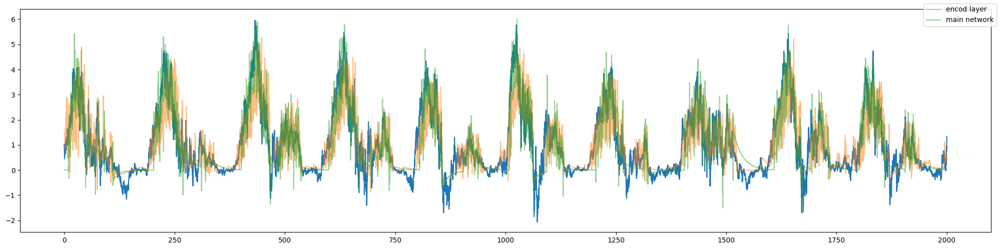

In [21]:
fig, ax = plt.subplots(
    nrows=1,
    ncols=1,
    figsize=(20,5)
)

ax.plot(
    time,
    sig
)

ax.plot(
    time,
    enc_estimate,
    alpha=0.5,
    label="encod layer"
)

ax.plot(
    time,
    main_estimate,
    alpha=0.5,
    label="main network"
)

# ax.set_xlim(0,1_000)
fig.legend()

plt.tight_layout()
plt.show()

In [22]:
from sklearn.decomposition import PCA

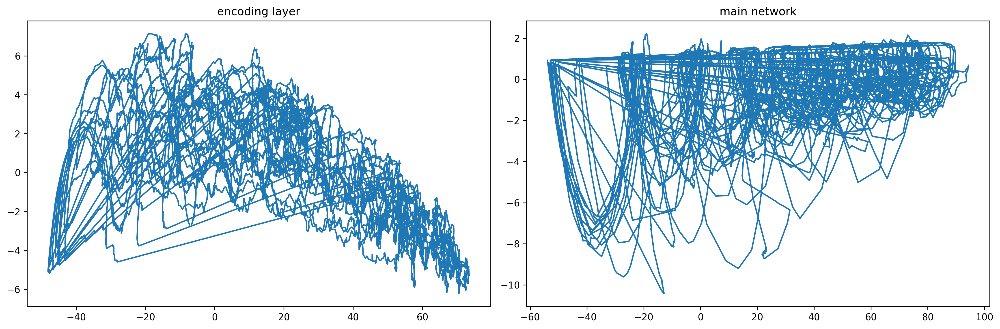

In [23]:
fig,ax = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(15,5),
    dpi=300
)

for iX,X in enumerate([enc_states, main_states]):

    components = PCA(n_components=10).fit_transform(X.T)
    
    ax[iX].plot(
        components[:,0],
        components[:,1]
    )

ax[0].set_title("encoding layer")
ax[1].set_title("main network")

plt.tight_layout()
plt.show()

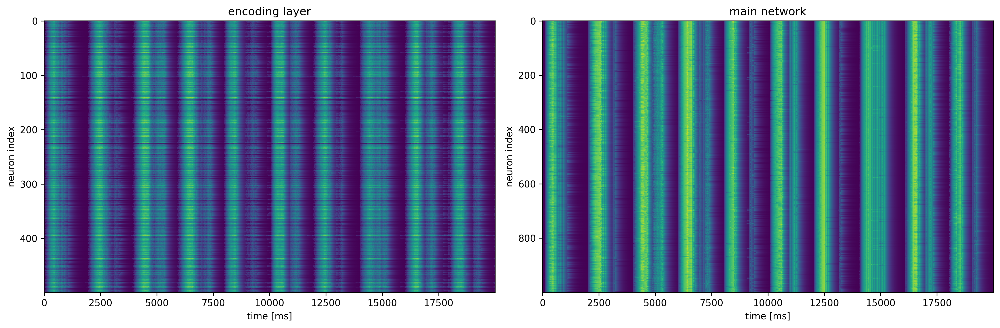

In [24]:
fig,ax = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(15,5),
    dpi=300
)

for iX,X in enumerate([enc_states, main_states]):
    
    ax[iX].imshow(
        X,
        aspect="auto",
    )

ax[0].set_title("encoding layer")
ax[1].set_title("main network")

ax[0].set_xlabel("time [ms]")
ax[1].set_xlabel("time [ms]")

ax[0].set_ylabel("neuron index")
ax[1].set_ylabel("neuron index")

plt.tight_layout()
plt.show()

In [25]:
subsampling_factor = 1 # ms
max_lag = 100 # ms
step_lag = 5.0 / subsampling_factor

def compute_capacity_sequential(
    time_vector,
    signal,
    enc_states,
    ex_states,
    subsampling_factor,
    max_lag=100.0,
    step_lag=10,
    dt=0.1,
    verbose=False
):
    """

    Parameters
    ----------
    time_vector
    signal
    enc_states
    ex_states
    subsampling_factor
    max_lag : float
        Maximum lag / delay for which to evaluate memory capacity
    dt

    Returns
    -------

    """
    # Adjust the maximum lag and step lag based on the subsampling factor
    max_lag_subsampled = max_lag / subsampling_factor  # in milliseconds
    step_lag_subsampled = step_lag / subsampling_factor  # default step is 10 ms, scaled by subsampling factor

    # Create the array of time lags (subsampled) based on max_lag and step_lag
    time_lags = np.arange(dt, max_lag_subsampled, step_lag_subsampled)

    # Find indices in the time vector corresponding to these time lags
    indices = [np.where(time_vector == lag)[0][0] for lag in time_lags]

    # Compute the initial index for subsampling based on subsampling factor and dt
    initial_index = max(0, int(subsampling_factor * dt))

    # Generate the indices for subsampling the signal
    subsampling_indices = np.arange(initial_index, len(signal) + initial_index, subsampling_factor, dtype=int)

    # Subsample the signal using the generated indices
    subsampled_signal = signal[subsampling_indices]

    # Initialize lists to store capacities
    encoder_capacity = []
    circuit_capacity = []

    for shift, lag in zip(indices, time_lags):
        # shift the target signal
        if shift > 0:
            shifted_signal = subsampled_signal[:-shift]
        else:
            shifted_signal = subsampled_signal

        # shift the population states
        enc_st = enc_states[:, shift:]
        circ_st = ex_states[:, shift:]

        # compute capacity
        enc_estimate, enc_capacity, enc_error = compute_capacity(enc_st, shifted_signal)
        circ_estimate, circ_capacity, circ_error = compute_capacity(circ_st, shifted_signal)

        if verbose:
            print(f"Lag = {lag * subsampling_factor} ms")
            print(f"Encoding Layer: \n\t- Capacity={enc_capacity}, MSE={enc_error}")
            print(f"Main Circuit: \n\t- Capacity={circ_capacity}, MSE={circ_error}")

        encoder_capacity.append(enc_capacity)
        circuit_capacity.append(circ_capacity)

    return time_lags * subsampling_factor, encoder_capacity, circuit_capacity

In [26]:
time_capacity, encoder_capacity, main_capacity = compute_capacity_sequential(
    time_vector=time,
    signal=sig, 
    enc_states=enc_states,
    ex_states=main_states,
    subsampling_factor=subsampling_factor,
    max_lag=max_lag,
    step_lag=step_lag,
    dt=dt,
    verbose=True
)

Lag = 0.1 ms
Encoding Layer: 
	- Capacity=0.6819169274331018, MSE=0.5042590783598391
Main Circuit: 
	- Capacity=0.7543104303154947, MSE=0.4001514893514663
Lag = 5.1 ms
Encoding Layer: 
	- Capacity=0.7874204071714045, MSE=0.3381949595988856
Main Circuit: 
	- Capacity=0.838844687034561, MSE=0.25615179060737797
Lag = 10.1 ms
Encoding Layer: 
	- Capacity=0.8239989324465499, MSE=0.28199812060047297
Main Circuit: 
	- Capacity=0.8561501230392851, MSE=0.23177042475999596
Lag = 15.1 ms
Encoding Layer: 
	- Capacity=0.8187293124559522, MSE=0.2913297717804212
Main Circuit: 
	- Capacity=0.8517545894155687, MSE=0.24453366616068897
Lag = 20.1 ms
Encoding Layer: 
	- Capacity=0.7783938411160594, MSE=0.35625801446554195
Main Circuit: 
	- Capacity=0.8444893749563918, MSE=0.25879667011583174
Lag = 25.1 ms
Encoding Layer: 
	- Capacity=0.7077806256140705, MSE=0.4677410879822574
Main Circuit: 
	- Capacity=0.8150152652731173, MSE=0.3043999955646605
Lag = 30.1 ms
Encoding Layer: 
	- Capacity=0.6443456100746044

In [28]:
np.save(os.path.join(results_fodler_name, "time_capacity"), time_capacity)
np.save(os.path.join(results_fodler_name, "encoder_capacity"), encoder_capacity)
np.save(os.path.join(results_fodler_name, "main_capacity"), main_capacity)

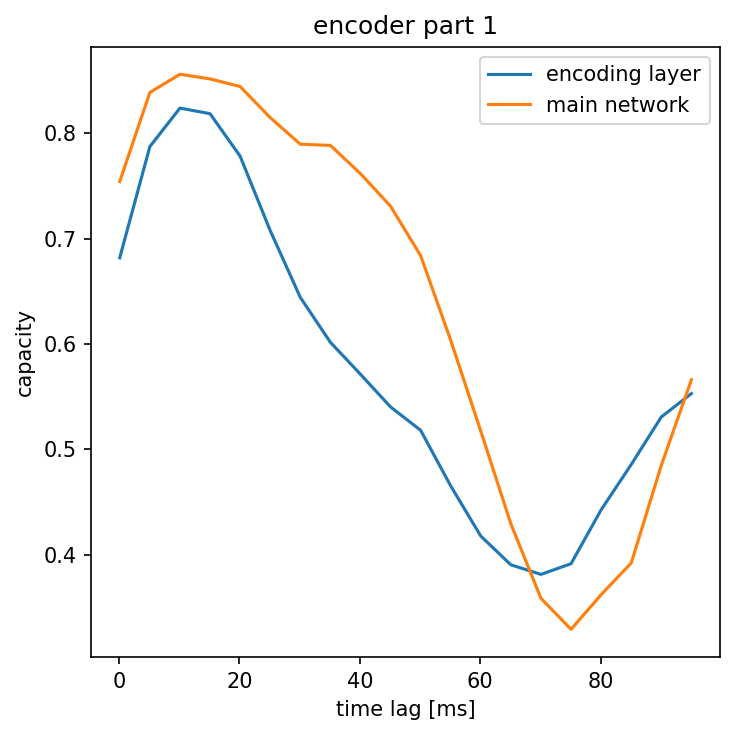

Total capacity (encoder): 57.6599604168444 ms
Total capacity (processor): 63.792419457979655 ms


In [29]:
fig,ax = plt.subplots(
    nrows=1,
    ncols=1,
    figsize=(5,5),
    dpi=150,
    sharey=True
)

ax.plot(
    time_capacity,
    encoder_capacity,
    label="encoding layer"
)
ax.plot(
    time_capacity,
    main_capacity,
    label="main network"
)

ax.legend()
ax.set_title("encoder part 1")
ax.set_ylabel("capacity")
ax.set_xlabel("time lag [ms]")



plt.tight_layout()
fig.savefig(os.path.join(results_fodler_name, "memory_capacity.pdf"))
plt.show()

print(f"Total capacity (encoder): {np.sum(encoder_capacity)*step_lag} ms")
print(f"Total capacity (processor): {np.sum(main_capacity)*step_lag} ms")